In [1]:
%load_ext autoreload
%autoreload 2

In [2]:
import os
import json

# Data Wrangling
import h5py
import numpy as np
import pandas as pd

# Plotting
import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec

# Load Tail Angle

In [3]:
df = pd.read_hdf('Danionella.h5')

In [4]:
df.head(10)

,x,y,theta,tail_angle_01,tail_angle_02,tail_angle_03,tail_angle_04,tail_angle_05,tail_angle_06,tail_angle_07,...,tail_value_01,tail_value_02,tail_value_03,tail_value_04,tail_value_05,tail_value_06,tail_value_07,tail_value_08,tail_value_09,tail_value_10
frame_id,,,,,,,,,,,,,,,,,,,,,
305901,354.6027,762.4877,1.688693,-0.057569,-0.098585,0.079641,0.049129,-0.082754,-0.128328,-0.083319,...,110.2709,107.3225,60.82891,90.88052,76.23203,51.16987,44.68130,43.60098,0.00000,0.0
305902,354.7846,762.4101,1.679170,-0.049721,-0.110686,0.082935,0.060231,-0.066932,-0.100862,-0.116938,...,108.7593,118.9064,71.30074,84.24125,77.45908,48.44184,46.75766,48.87668,3.97171,0.0
305903,354.7972,762.2639,1.680839,-0.063216,-0.105089,0.083205,0.053699,-0.052808,-0.083353,-0.116282,...,112.0417,119.4430,82.47068,82.50231,69.73067,52.13729,47.75901,42.42837,0.00000,0.0
305904,354.9238,762.0828,1.677423,-0.060133,-0.113719,0.073875,0.065227,-0.009110,-0.101244,-0.110419,...,113.9246,124.5385,92.53473,83.81439,74.69270,54.38569,47.64020,43.64951,0.00000,0.0
305905,354.8554,762.4290,1.676634,-0.036935,-0.148548,0.095650,0.001300,0.095087,-0.151557,-0.096062,...,112.6283,113.8588,97.03622,96.01034,59.95189,62.38118,45.84756,42.23901,0.00000,0.0
305906,354.9251,762.2833,1.676751,-0.025943,-0.151010,0.034835,0.084802,0.017422,-0.076704,-0.084571,...,116.6183,113.7184,91.00258,97.86189,73.53310,51.08514,49.02306,43.50781,0.00000,0.0
305907,354.9701,762.2706,1.679253,-0.029676,-0.154981,0.040370,0.071754,0.004252,-0.026808,-0.088701,...,119.7308,112.0695,88.51680,88.31061,75.30571,53.76753,52.34233,41.39820,0.00000,0.0
305908,355.0045,762.0753,1.681015,-0.049407,-0.124992,0.026483,0.080777,-0.039683,0.034957,-0.095538,...,117.7122,113.0838,84.81815,80.49852,82.55347,57.28442,52.53932,42.61259,0.00000,0.0
305909,354.9362,762.7366,1.679855,-0.003576,-0.172042,-0.014626,0.082224,0.014183,0.051321,-0.101861,...,127.7499,123.9602,86.90324,71.24934,75.41571,52.09628,47.68031,40.06295,0.00000,0.0


In [30]:
from AllSegmentationClass import Tail

# use tail value as a mask:
NumSegment = sum(['tail_angle' in df.columns[i] for i in range(len(df.columns))])

tail_angle = df[['tail_angle_'+str(i).zfill(2) for i in range(1,NumSegment+1)]]
tail_angle = tail_angle.values

# Reshape tail angle if head restrained:
if tail_angle.shape[1]==16:
    from skimage.transform import resize
    tail_angle = resize(tail_angle, (tail_angle.shape[0], 10),order=0) # 0 for nearest neighbor

tail = Tail(tail_angle)
tail.tail_angle_preprocessing()

print('Shape of No Track:')
print(len(tail.notrack_id))

tail_angle = tail.angle_smooth[:,:]
print(tail_angle.shape)

Shape of No Track:
11117
(8747873, 10)


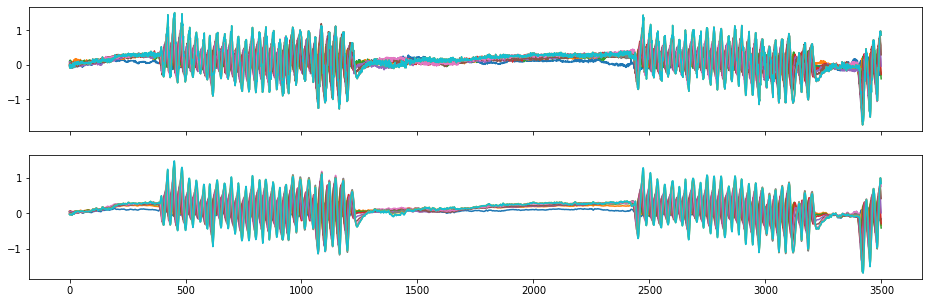

In [31]:
# Diagnostic Plot:
Duration = 700*5
IdSt = np.random.randint(tail.T-Duration)
fig, (ax) = plt.subplots(2,1,figsize=(16,5), sharex=True)
ax[0].plot(tail.angle[IdSt:IdSt+Duration,:])
ax[1].plot(tail.angle_smooth[IdSt:IdSt+Duration,:])
plt.show()

# Load Dictionary

In [32]:
Atoms_Dataset = np.load('./sparse_coding/AtomDictionaryDanionella.npy',allow_pickle=True).all()
Num_version = len(Atoms_Dataset)
List_NumAtoms = Atoms_Dataset[0].keys()
print(List_NumAtoms)
List_NumAtoms = [2,5]
Dict_list = []
for i in range(Num_version):
    for j in List_NumAtoms:
        Dict_list.append(Atoms_Dataset[i][j])
print(len(Dict_list))

dict_keys([1, 2, 3, 4, 5, 6])
6


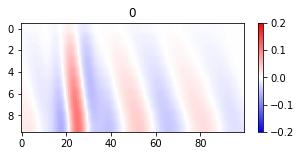

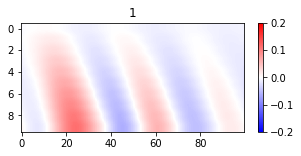

In [64]:
D = Dict_list[0]
for i in range(D.shape[-1]):
    plt.figure(figsize=(5,2))
    plt.title(str(i))
    plt.imshow(D[:,:,i].T,aspect='auto',vmin=-0.2,vmax=0.2,cmap='bwr')
    plt.colorbar()
    plt.show()

# Sparse coding

In [65]:
from sparse_coding.SparseEncodingFunctional import compute_sparse_code

In [66]:
z_list = []
for n in range(len(Dict_list)):
    print(n)
    sparse_code_f = compute_sparse_code(Dict_list[n],.8)
    z,tail_angle_hat = sparse_code_f(tail_angle)
    z_list.append(z)

0
1
2
3
4
5


# Find changes in firing rate in sparse code

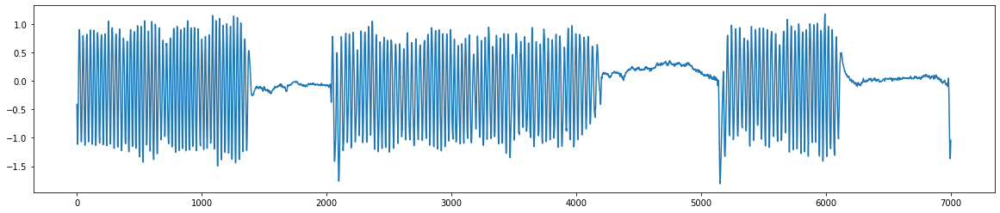

In [70]:
Duration = 700*10
IdSt= np.random.randint(z.shape[0]-Duration)

plt.figure(figsize=(20,4))
plt.plot(tail_angle[IdSt:IdSt+Duration,-1])
#plt.plot(tail_angle_hat[IdSt:IdSt+Duration,-1])
plt.show()

#plt.figure(figsize=(20,4))
#plt.plot(z[IdSt:IdSt+Duration,:])
#plt.show()


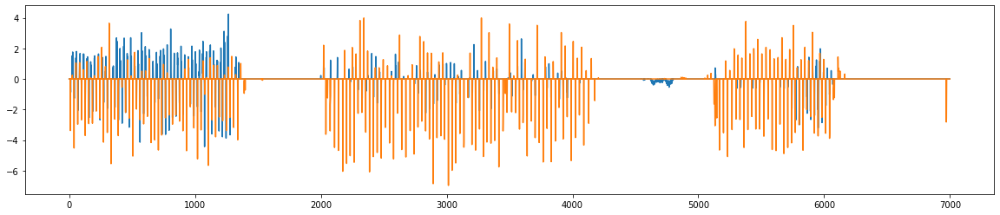

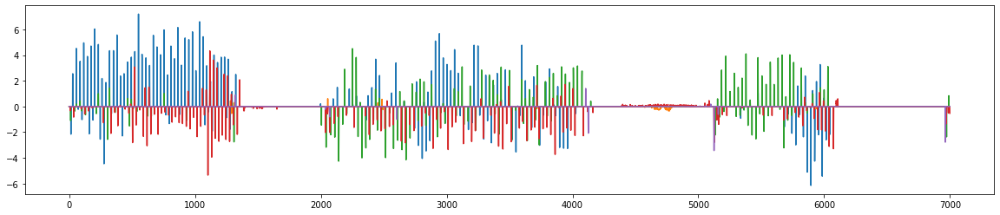

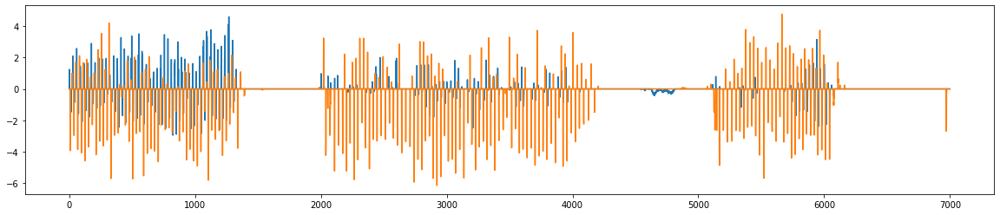

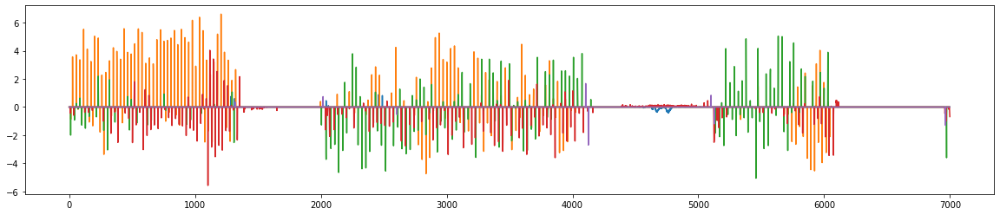

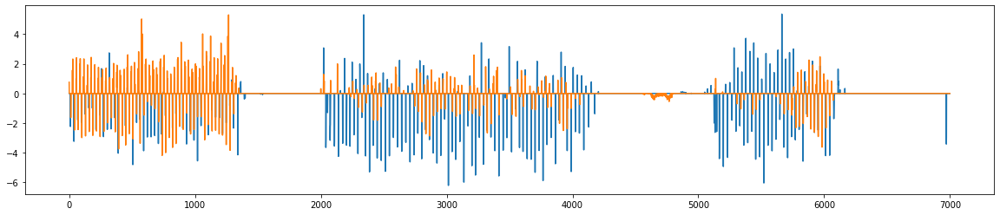

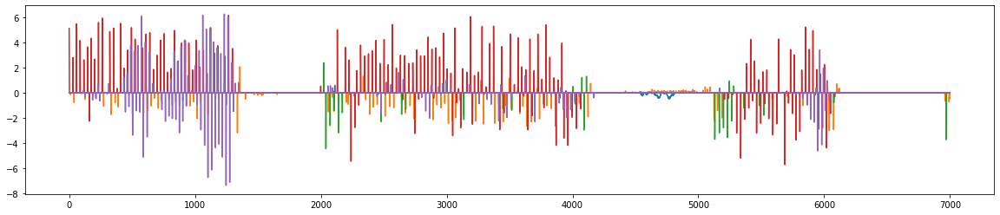

In [71]:
for i in range(len(z_list)):
    z = z_list[i]
    plt.figure(figsize=(20,4))
    plt.plot(z[IdSt:IdSt+Duration,:])
    plt.show()

In [72]:
from sparse_coding.SparseEncodingFunctional import compute_likelihood_ratio_test

likelihood_ratio_test = compute_likelihood_ratio_test(50)

In [73]:
likelihood_ratio_alternative = []

for i in range(len(z_list)):
    print(i)
    z = z_list[i]
    likelihood_ratio = likelihood_ratio_test(z)
    likelihood_ratio = np.sum(likelihood_ratio,axis=1)
    likelihood_ratio = likelihood_ratio/np.std(likelihood_ratio)
    likelihood_ratio_alternative.append(likelihood_ratio)

0
0.024005835475663626
0.04801167095132725
0.07201750642699088
0.0960233419026545
0.12002917737831814
0.14403501285398176
0.1680408483296454
0.192046683805309
0.21605251928097263
0.24005835475663628
0.2640641902322999
0.28807002570796353
0.3120758611836272
0.3360816966592908
0.3600875321349544
0.384093367610618
0.40809920308628167
0.43210503856194526
0.4561108740376089
0.48011670951327257
0.5041225449889362
0.5281283804645998
0.5521342159402635
0.5761400514159271
0.6001458868915907
0.6241517223672544
0.648157557842918
0.6721633933185815
0.6961692287942451
0.7201750642699088
0.7441808997455724
0.768186735221236
0.7921925706968997
0.8161984061725633
0.8402042416482269
0.8642100771238905
0.8882159125995542
0.9122217480752178
0.9362275835508814
0.9602334190265451
0.9842392545022087
1
0.024005835475663626
0.04801167095132725
0.07201750642699088
0.0960233419026545
0.12002917737831814
0.14403501285398176
0.1680408483296454
0.192046683805309
0.21605251928097263
0.24005835475663628
0.2640641902

In [ ]:
likelihood_ratio

<function sparse_coding.SparseEncodingFunctional.compute_likelihood_ratio_test(win_size=50)>

In [ ]:
Duration = 700*7+200
IdSt = np.random.randint(tail_angle.shape[0]-Duration)

plt.figure(figsize=(20,4))
plt.plot(tail_angle[IdSt:IdSt+Duration,-1])
plt.plot(tail_angle_hat[IdSt:IdSt+Duration,-1])

plt.figure(figsize=(20,4))
plt.plot(z[IdSt:IdSt+Duration,:])
plt.figure(figsize=(20,4))
plt.plot(likelihood_ratio[IdSt:IdSt+Duration])
plt.hlines(2,0,Duration)

In [ ]:
plt.figure(figsize=(20,4))
plt.plot(tail_angle[IdSt:IdSt+Duration,-1])

for i in range(len(likelihood_ratio_alternative)):
    print(i)    
    likelihood_ratio = likelihood_ratio_alternative[i]
    plt.figure(figsize=(20,4))
    plt.plot(likelihood_ratio[IdSt:IdSt+Duration])
    plt.hlines(2,0,Duration)

plt.figure(figsize=(20,4))
plt.plot(tail_angle[IdSt:IdSt+Duration,-1])

plt.figure(figsize=(20,4))
x = np.sum(np.array([likelihood_ratio_alternative[i][IdSt:IdSt+Duration] for i in range(len(likelihood_ratio_alternative))]),axis=1)
plt.hlines(12,0,Duration)

# Segmentation using simple segmentation + Likelihood ratio test to find double bouts

In [13]:
from AllSegmentationClass import Binarization

In [14]:
bin = Binarization(tail)

In [15]:
bin.compute_low_pass_speed(win_BC = 10,MinFiltSize=500,MaxFiltSize=20)
bin.compute_noiselevel(win_zscore = 30,win_smoothing = 7, win_med=51)

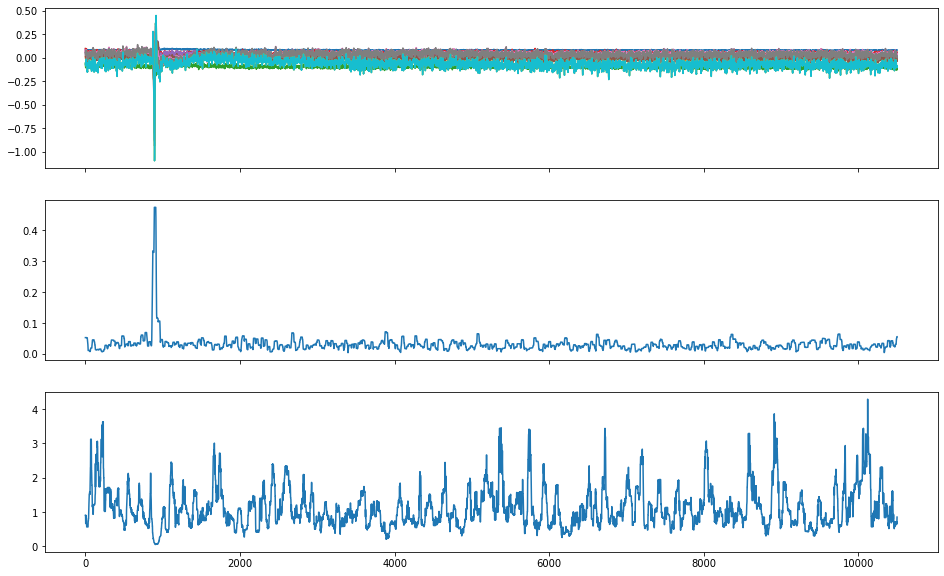

In [16]:
# Diagnostic Plot:
Duration = 700*15
IdSt = np.random.randint(tail.T-Duration)
fig, (ax) = plt.subplots(3,1,figsize=(16,10), sharex=True)
ax[0].plot(tail.angle_smooth[IdSt:IdSt+Duration,:])

ax[1].plot(bin.low_pass_speed[IdSt:IdSt+Duration])
ax[2].plot(bin.smooth_residual[IdSt:IdSt+Duration])

plt.show()

0.11177954102847826


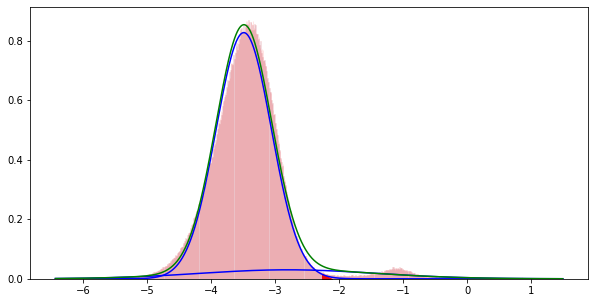

In [17]:
# Compute Threshold on speed:
fig = plt.figure(figsize=(10,5))
ax = fig.add_subplot(111)
SpeedThresh,ax = bin.estimate_threshold_using_GMM(bin.low_pass_speed,margin_std = 3, axis=ax)
print(SpeedThresh)

0.44351619395092556


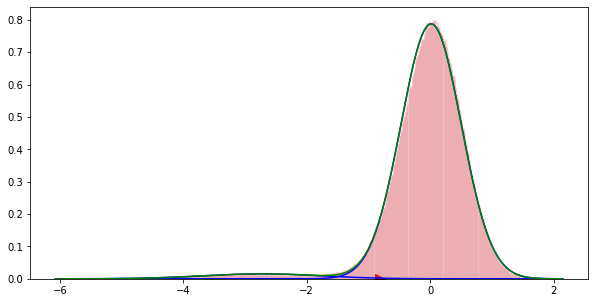

In [23]:
# Compute Threshold on noise:
fig = plt.figure(figsize=(10,5))
ax = fig.add_subplot(111)
NoiseThresh,ax = bin.estimate_threshold_using_GMM(bin.smooth_residual,margin_std = 2, axis=ax)
print(NoiseThresh)

In [27]:
# Multiplicative Constrain: speed above SpeedThresh & noise below NoiseThresh 
tail_active1 = 1.0*(bin.low_pass_speed>SpeedThresh)#(bin.smooth_residual<NoiseThresh)
tail_active2 = 1.0*(bin.smooth_residual<NoiseThresh)
#np.logical_or(bin.smooth_residual>NoiseThresh,bin.low_pass_speed<SpeedThresh)
from AllSegmentationClass import find_onset_offset_numpy

tail_active = 1.0*((tail_active1+tail_active2)>0)
tail_active = tail_active1
onset,offset,duration = find_onset_offset_numpy(tail_active)

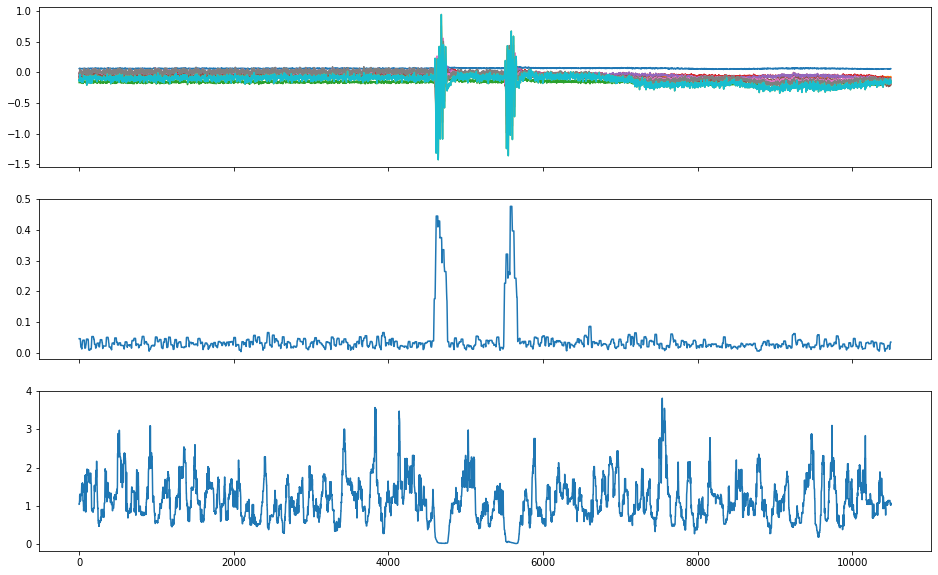

In [28]:

# Diagnostic Plot:
Duration = 700*15
IdSt = np.random.randint(tail.T-Duration)
fig, (ax) = plt.subplots(3,1,figsize=(16,10), sharex=True)
ax[0].plot(tail.angle_smooth[IdSt:IdSt+Duration,:])

ax[1].plot(bin.low_pass_speed[IdSt:IdSt+Duration])
ax[2].plot(bin.smooth_residual[IdSt:IdSt+Duration])

plt.show()

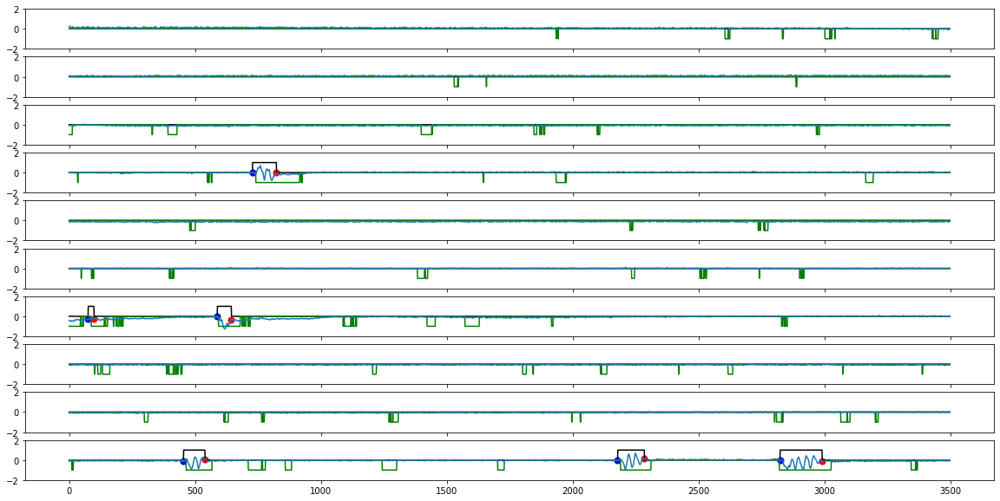

In [29]:
# Diagnostic Plot:
Duration = 700*5
s = tail.Reference_tail_segment_end
fig, (ax) = plt.subplots(10,1,figsize=(20,10), sharex=True)
for i in range(10):
    IdSt = np.random.randint(tail.T-Duration)
    ax[i].plot(tail_active1[IdSt:IdSt+Duration],'k')
    ax[i].plot(-tail_active2[IdSt:IdSt+Duration],'g')
    id = np.where(np.diff(tail_active[IdSt:IdSt+Duration])==1)[0]
    if len(id)>0:
        ax[i].scatter(id,tail.angle_smooth[IdSt:IdSt+Duration,s][id],s=50,c='b')
    id = np.where(np.diff(tail_active[IdSt:IdSt+Duration])==-1)[0]
    if len(id)>0:
        ax[i].scatter(id,tail.angle_smooth[IdSt:IdSt+Duration,s][id],s=50,c='r')
    ax[i].plot(tail.angle_smooth[IdSt:IdSt+Duration,s])
    ax[i].set_ylim(-2,2)
plt.show()

In [30]:
# Could be useful to add some cleanup to tail active:
# morphological opening to erode then dilate

# Finding Half Beat

In [31]:
from AllSegmentationClass import HalfBeat

In [32]:
HB = HalfBeat(tail_active,tail)

In [33]:
HB.find_slice(Min_Duration = 80,Min_IBI = 10)
HB.extract_half_beat(Half_BCFilt = 150, stdThres = 5,MinSizeBlob=400,Margin=10)

In [34]:
peaks_pos,peaks_neg = HB.half_beat_pos,HB.half_beat_neg

In [35]:
tail_active = HB.refine_bouts(MaxIBeatI = 40)
onset,offset,duration = find_onset_offset_numpy(tail_active)

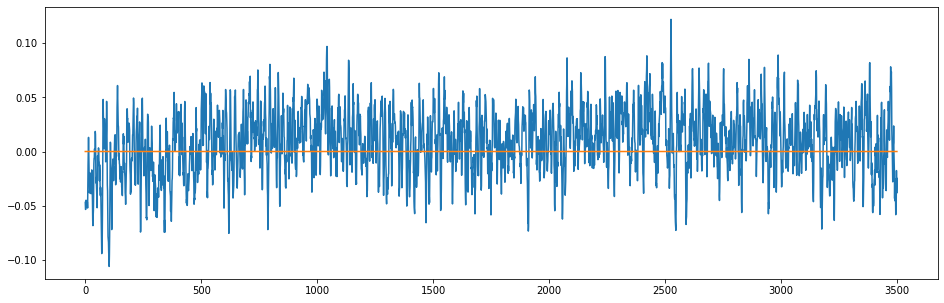

In [36]:
# Diagnostic Plot:
Duration = 700*5
IdSt = np.random.randint(tail.T-Duration)
s = tail.Reference_tail_segment_end

fig, (ax) = plt.subplots(1,1,figsize=(16,5), sharex=True)

id = peaks_pos[(peaks_pos>IdSt)&(peaks_pos<(IdSt+Duration))]-IdSt
ax.scatter(id,tail.angle_smooth[IdSt:IdSt+Duration,s][id],s=50,c='b')

id = peaks_neg[(peaks_neg>IdSt)&(peaks_neg<(IdSt+Duration))]-IdSt
ax.scatter(id,tail.angle_smooth[IdSt:IdSt+Duration,s][id],s=50,c='r')

ax.plot(tail.angle_smooth[IdSt:IdSt+Duration,s])
ax.plot(HB.tail_active_in[IdSt:IdSt+Duration])

plt.show()

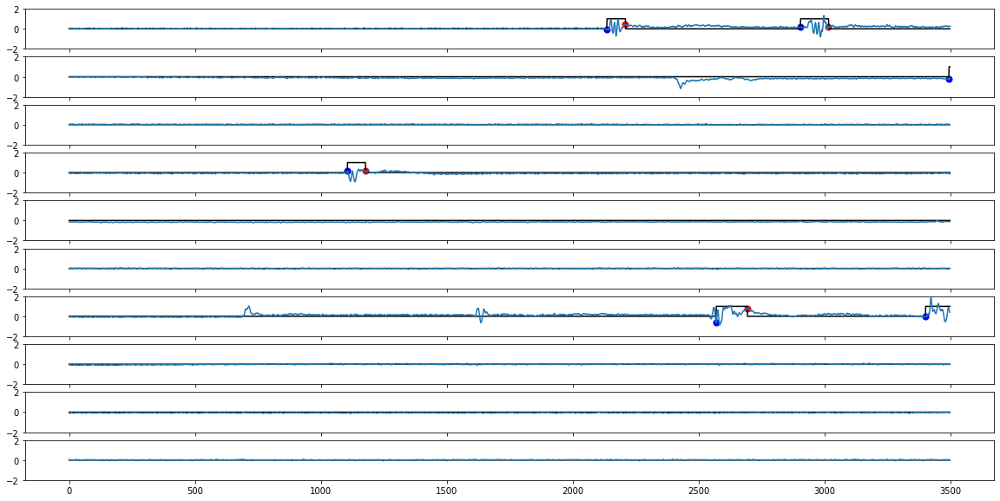

In [38]:
# Diagnostic Plot:
Duration = 700*5
s = tail.Reference_tail_segment_end
fig, (ax) = plt.subplots(10,1,figsize=(20,10), sharex=True)
for i in range(10):
    IdSt = np.random.randint(tail.T-Duration)
    ax[i].plot(tail_active[IdSt:IdSt+Duration],'k')
    id = np.where(np.diff(tail_active[IdSt:IdSt+Duration])==1)[0]
    if len(id)>0:
        ax[i].scatter(id,tail.angle_smooth[IdSt:IdSt+Duration,s][id],s=50,c='b')
    id = np.where(np.diff(tail_active[IdSt:IdSt+Duration])==-1)[0]
    if len(id)>0:
        ax[i].scatter(id,tail.angle_smooth[IdSt:IdSt+Duration,s][id],s=50,c='r')
    ax[i].plot(tail.angle_smooth[IdSt:IdSt+Duration,s])
    ax[i].set_ylim(-2,2)
plt.show()

# Identify Breakpoint to cut doublebouts

In [39]:
tail_signal = tail.angle_smooth[:700*60*30,tail.Reference_tail_segment_end]

all_peaks = np.concatenate((HB.half_beat_pos,HB.half_beat_neg))
all_peaks = np.sort(all_peaks)
all_peaks = all_peaks[all_peaks<tail_signal.shape[0]]


In [40]:
from AllSegmentationClass import BreakPoint

In [41]:
breakpoint = BreakPoint()
L=4
peaks,likelihood_ratio = breakpoint.evaluate_break_point(tail_signal,L,onset,offset,all_peaks,margin_time=[90,30],sigma=None,method='costafast')

In [42]:
likelihood_ratio.shape

(48,)

0.274622331854637
159.75211233793704


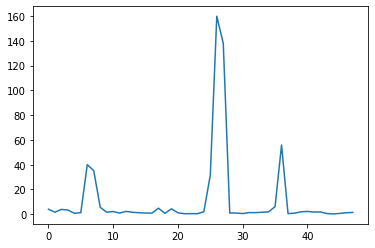

In [43]:
print(np.min(likelihood_ratio))
print(np.max(likelihood_ratio))
plt.plot(likelihood_ratio)
plt.show()

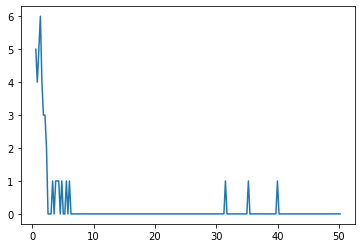

In [44]:
hist, bins = np.histogram(likelihood_ratio,range=(np.percentile(likelihood_ratio,5),np.percentile(likelihood_ratio,95)),bins = 200)
plt.plot(0.5*(bins[1:]+bins[0:-1]),hist)
plt.show()

In [45]:
print(np.percentile(likelihood_ratio,90))
Thresh = np.percentile(likelihood_ratio,90)

32.6936517329904


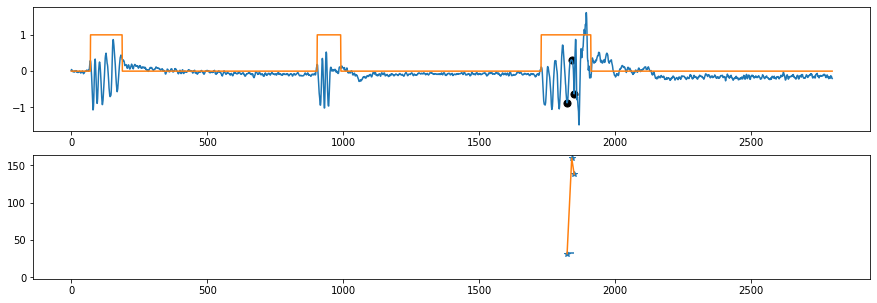

In [53]:
Duration = 700*4
while True:
    #IdSt = 2396873
    IdSt = 73262
    IdSt = np.random.randint(tail_signal.shape[0]-Duration)
    id = peaks[(peaks>IdSt)&(peaks<(IdSt+Duration))]-IdSt
    if len(id)>2:
        break

fig = plt.figure(figsize=(15,5))

s = tail.Reference_tail_segment_end
ax1 = plt.subplot(211)
ax1.plot(tail.angle_smooth[IdSt:IdSt+Duration,s])
ax1.plot(tail_active[IdSt:IdSt+Duration])

#on_,off_ = onset[(onset>IdSt)&(onset<IdSt+Duration)],offset[(offset>IdSt)&(offset<IdSt+Duration)]
#on_,off_ = on_-IdSt,off_-IdSt
ax1.scatter(id,tail.angle_smooth[IdSt:IdSt+Duration,s][id],s=50,c='k')
#ax1.scatter(on_,np.zeros_like(on_),s=20,c='b')
#ax1.scatter(off_,np.zeros_like(off_),s=20,c='r')

ax2 = plt.subplot(212, sharex = ax1)
l = likelihood_ratio[(peaks>IdSt)&(peaks<(IdSt+Duration))]
ax2.plot(id,l,'*')
#ax2.stem(id,l)
ax2.plot(id,l)
ax2.hlines(Thresh,id[0],id[-1])

ax2.set_ylim(-2,Thresh*5)
plt.show()

In [54]:

all_peaks = np.concatenate((HB.half_beat_pos,HB.half_beat_neg))
all_peaks = np.sort(all_peaks)
all_peaks = all_peaks[all_peaks<tail_signal.shape[0]]

#peaks,likelihood_ratio
onset,offset,duration = find_onset_offset_numpy(tail_active[:tail_signal.shape[0]])

# Split bout
break_point = peaks[likelihood_ratio>Thresh]
likelihood_ratio_break_point = likelihood_ratio[likelihood_ratio>Thresh]


In [55]:
bouts_onset,bouts_offset = breakpoint.segment_from_breakpoint(onset,offset,all_peaks,break_point,likelihood_ratio_break_point,MinBoutDuration=60)

[145 146 147 148 149]


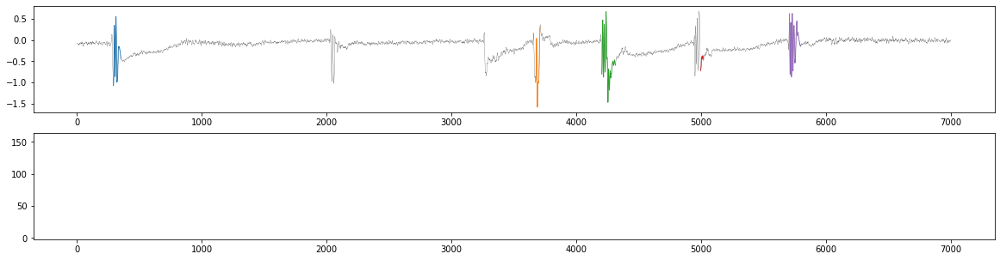

In [120]:
Duration = 700*10
IdSt = 300938# np.random.randint(tail_signal.shape[0]-Duration)
while True:
    IdSt = np.random.randint(tail_signal.shape[0]-Duration)
    id = np.where((bouts_onset>IdSt)&(bouts_onset<IdSt+Duration))[0]
    if len(id)>2:
        print(id)
        break

fig = plt.figure(figsize=(20,5))

s = tail.Reference_tail_segment_end
ax1 = plt.subplot(211)
ax1.plot(tail.angle_smooth[IdSt:IdSt+Duration,s],lw=.2,c='k')
#ax1.plot(tail_active[IdSt:IdSt+Duration])

on_ = bouts_onset[id]
off_ = bouts_offset[id]
on_,off_ = on_-IdSt,off_-IdSt

for i1,i2 in zip(on_,off_):
    ax1.plot(np.arange(i1,i2),tail.angle_smooth[IdSt+i1:IdSt+i2,s],lw=.8)

id = peaks[(peaks>IdSt)&(peaks<(IdSt+Duration))]-IdSt

ax2 = plt.subplot(212, sharex = ax1)
l = likelihood_ratio[(peaks>IdSt)&(peaks<(IdSt+Duration))]
if len(id)>2:
    ax2.plot(id,l,'*')
    ax2.hlines(Thresh,id[0],id[-1])

ax2.set_ylim(-2,Thresh*5)
plt.show()

# Compute DTW Distance with Core Bouts

In [99]:
import numpy as np
from scipy import signal

from tslearn import metrics

def dist_between_bouts(x_i,x_j,dtw_rad = 15,Normalized = False):
    x_i_sub,x_j_sub = make_same_lenght(x_i,x_j)
    if Normalized:
        power = np.sqrt(0.5*((np.max(x_i_sub)-np.min(x_i_sub))+(np.max(x_j_sub)-np.min(x_j_sub))))
    else:
        power = 1
    sim = metrics.dtw(x_i_sub, x_j_sub,global_constraint='sakoe_chiba',sakoe_chiba_radius=dtw_rad)
    return sim/(power)


def make_same_lenght(x,y):
    id_nan = np.where(np.isnan(x[:,0]))[0]
    d_x = id_nan[0] if len(id_nan) > 0 else x.shape[0]
    id_nan = np.where(np.isnan(y[:,0]))[0]
    d_y = id_nan[0] if len(id_nan) > 0 else y.shape[0]
    min_duration = min(d_x,d_y)
    x_sub = x[0:min_duration,:]
    y_sub = y[0:min_duration,:]
    return x_sub,y_sub

In [100]:
# Collect all bouts :
duration = [off_-on_ for on_,off_ in zip(bouts_onset,bouts_offset)]

NumBouts = len(bouts_onset)
MaxDuration = max(duration)
Margin = 20 # Bouts start 20 frame before onset
print(MaxDuration)

all_bouts = np.nan * np.ones((NumBouts,MaxDuration+Margin,tail.angle_smooth.shape[1]))

for i,(on_,off_) in enumerate(zip(bouts_onset,bouts_offset)):
    tmp = tail.angle_smooth[on_-Margin:off_,:]
    all_bouts[i,:tmp.shape[0],:] = tmp


218


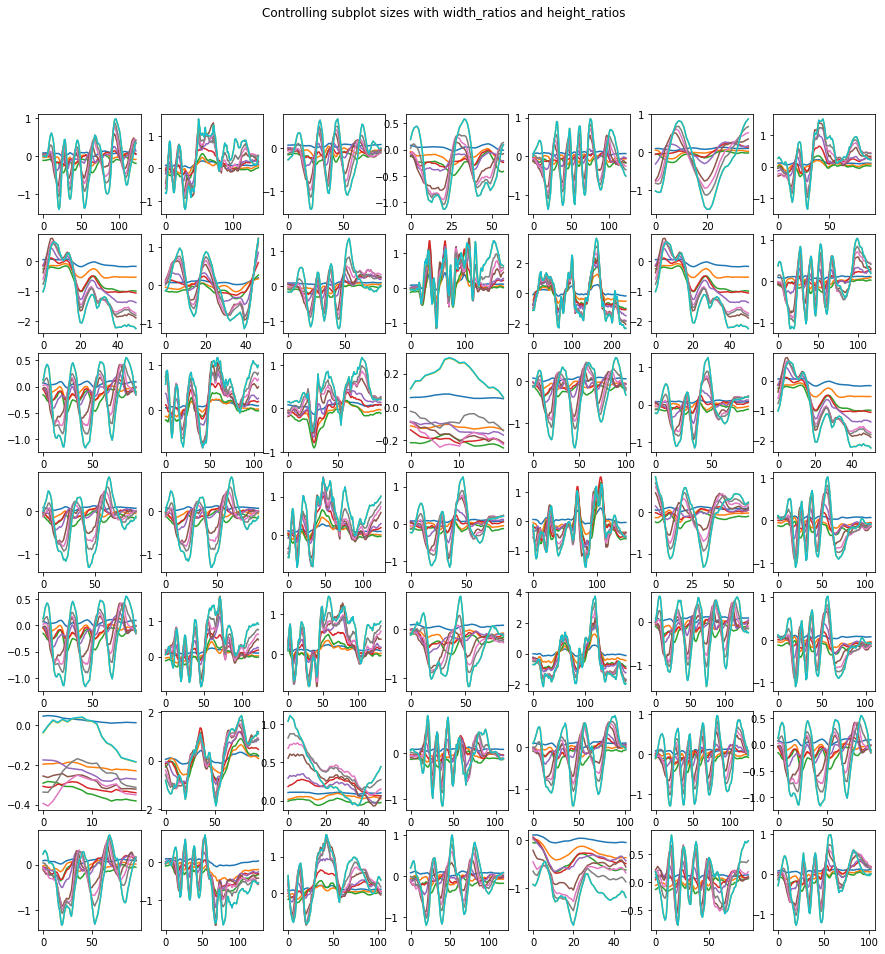

In [101]:
from matplotlib.gridspec import GridSpec

fig = plt.figure(figsize=(15,15))
fig.suptitle("Controlling subplot sizes with width_ratios and height_ratios")

gs = GridSpec(7, 7)
for i in range(7):
    for j in range(7):
        ax = fig.add_subplot(gs[i,j])
        k = np.random.randint(all_bouts.shape[0])
        ax.plot(all_bouts[k,:,:])
plt.show()

In [102]:
# Compute distance between bouts:
DistMatrix = np.zeros((NumBouts,NumBouts))
for i in range(NumBouts):
    for j in range(NumBouts):
        DistMatrix[i,j] = dist_between_bouts(all_bouts[i,:,:],all_bouts[j,:,:])


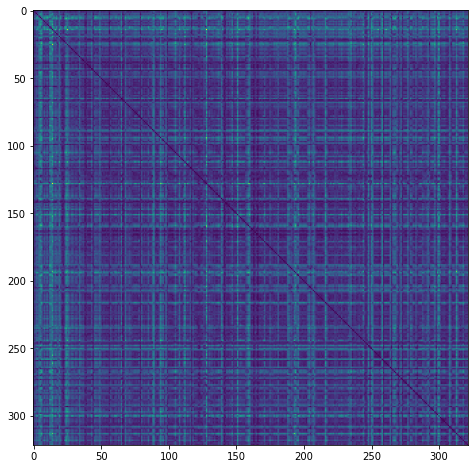

In [113]:
plt.figure(figsize=(8,8))
plt.imshow(DistMatrix)
plt.show()

In [121]:
A = DistMatrix
np.unravel_index(A[A>0].argmin(), A.shape)

(293, 15)

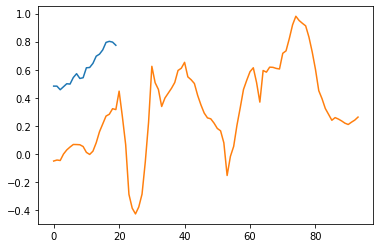

In [122]:
plt.plot(all_bouts[293,:,7])
plt.plot(all_bouts[15,:,7])